# **Simulation of the BB84 Protocol With and Without Eavesdropping**

In this notebook, we simulate the BB84 quantum key distribution protocol under two scenarios: an ideal quantum channel without eavesdropping and a channel subject to an intercept–resend attack performed by an adversary (Eve). The goal is to reproduce the expected behavior of the protocol by computing key metrics such as the sift rate and the quantum bit error rate (QBER). By comparing the results obtained in both cases, we illustrate how eavesdropping introduces detectable disturbances and leads to the acceptance or rejection of the generated key.

### Notebook Outline

1. **Environment Setup**
   - Required libraries and configuration
   - Global Variables

2. **BB84 Simulation Without Eve**
   - Simulation
   - Results
   - Trial

3. **BB84 Simulation With Eve**
   - Simulation
   - Results
   - Trial

4. **Conclusions**

5. **Appendix**
   - Circuit-level implementation of the BB84 protocol without eavesdropping
   - Circuit-level implementation of the BB84 protocol with eavesdropping



## 1. **Environment Setup**


In [1]:
!pip -q install qiskit qiskit-aer
!pip install pylatexenc

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from qiskit import QuantumCircuit
from qiskit_aer import Aer
from qiskit import transpile
from qiskit.visualization import circuit_drawer

### 1.1 **Global variables**

In [5]:
# Number of BB84 protocol rounds (number of qubits transmitted)
N = 400

# Seed for the random number generator to ensure reproducibility
seed = 1232

# Initialize NumPy random number generator
rng = np.random.default_rng(seed)

# Alice's random bit string (plaintext bits to be encoded)
# a_bits[i] ∈ {0,1} represents the classical bit encoded in round i
a_bits = rng.integers(0, 2, size=N)

# Bob's measurement outcomes (initialized to zero)
b_bits = np.zeros(N, dtype=int)

# Eve's measurement outcomes (initialized to zero)
e_bits = np.zeros(N, dtype=int)

# Alice's random choice of preparation bases
# a_basis[i] ∈ {Z, X} selects the encoding basis for round i
a_basis = rng.choice(['Z', 'X'], size=N)

# Eve 's random choice of preparation bases
# a_basis[i] ∈ {Z, X} selects the encoding basis for round i
e_basis = rng.choice(['Z', 'X'], size=N)

# Bob's random choice of measurement bases
# b_basis[i] ∈ {Z, X} selects the measurement basis for round i
b_basis = rng.choice(['Z', 'X'], size=N)

# Quantum backend (ideal simulator)
backend = Aer.get_backend("qasm_simulator")

In [6]:
# tests
print(a_bits)
#print(b_bits)
#print(e_bits)
#print(a_basis)
#print(e_basis)
#print(b_basis)

[0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 1 0 0 1
 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 0
 0 1 0 0 0 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 1 0 1
 0 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 0 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 1 1 0
 0 1 0 1 1 0 1 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0
 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 1
 1 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 1 1 1 0 1 0 1 0
 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 0 1 1 1
 0 1 0 1 1 1 0 1 0 0 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 1
 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 1 0]


## 2. **BB84 Simulation Without Eve**

### 2.1 **Simulation**

In [15]:
# Simulate Bob's measurement outcomes for each BB84 round

for i in range(N):

    # Create a single-qubit quantum circuit for round i
    qc = QuantumCircuit(1, 1)

    # --- State preparation by Alice ---
    # Encode the classical bit a_bits[i] using the basis a_basis[i]
    if a_basis[i] == 'Z':
        # Z basis: bit 0 -> |0>, bit 1 -> |1>
        if a_bits[i] == 1:
            qc.x(0)
    else:
        # X basis: bit 0 -> |+> = H|0>, bit 1 -> |-> = ZH|0>
        qc.h(0)
        if a_bits[i] == 1:
            qc.z(0)

    # --- Measurement by Bob ---
    # If Bob chooses the X basis, rotate before measuring in Z
    if b_basis[i] == 'X':
        qc.h(0)

    # Perform projective measurement in the computational (Z) basis
    qc.measure(0, 0)

    # Compile the circuit for the selected backend
    tqc = transpile(qc, backend)

    # Execute the circuit with a single shot to simulate one measurement outcome
    res = backend.run(tqc, shots=1).result()

    # Extract the measured bit and store it as Bob's outcome for round i
    counts = res.get_counts()
    b_bits[i] = int(next(iter(counts.keys())))

# Display Bob's measured bit string
print("Bob bits:", b_bits)


Bob bits: [0 1 0 0 1 1 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 0 0 1
 0 1 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 1 0 0 0 0
 0 0 0 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0
 1 1 1 0 0 0 0 1 1 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 0 1 0 0
 0 0 0 0 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 0 1
 1 1 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0
 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 0 1 0 0
 0 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 0 1 1 1 0 1 1 1 0 0 0 0 0 1 1 0 0 1
 1 0 0 0 1 1 0 1 1 1 1 0 1 0 0 1 1 0 0 0 1 1 0 0 0 1 1 0 1 0]


In [16]:
# Identify the rounds in which Alice and Bob chose the same basis
sift_mask = (a_basis == b_basis)

# Extract the sifted raw keys by keeping only the coincident-basis rounds

a_key = a_bits[sift_mask] # Alice's sifted raw key
b_key = b_bits[sift_mask] # Bob's sifted raw key

# Compute the sift rate, defined as the fraction of rounds in which Alice and Bob selected the same basis
sift_rate = np.mean(sift_mask)

# Compute the Quantum Bit Error Rate (QBER)
qber = np.mean(a_key != b_key) if len(a_key) > 0 else np.nan

# Display the results
print("SIFT RATE:", sift_rate)
print("SIFTED KEY LENGTH:", len(a_key))
print("QBER:", qber)


SIFT RATE: 0.5125
SIFTED KEY LENGTH: 205
QBER: 0.0


### 2.2 **Results**

In [17]:
# --- Summary  ---
summary = pd.DataFrame({
    "N": [N],
    "sifted_len": [len(a_key)],
    "sift_rate": [sift_rate],
    "QBER": [qber]
})
display(summary)

# --- Round-by-round log  ---
df = pd.DataFrame({
    "round": np.arange(N),
    "A_basis": a_basis,
    "a_bit": a_bits,
    "B_basis": b_basis,
    "b_bit": b_bits,
    "kept": sift_mask
})

# The kept rounds
df_kept = df[df["kept"]].reset_index(drop=True)
display(df_kept.head(30))  # show first 30 kept rounds


print("Kept indices (first 30):", kept_idx[:30], "..." if len(kept_idx) > 30 else "")
print("Alice sifted key (first 50):", a_key[:50], "..." if len(a_key) > 50 else "")
print("Bob   sifted key (first 50):", b_key[:50], "..." if len(b_key) > 50 else "")


,N,sifted_len,sift_rate,QBER
0,400,205,0.5125,0.0


,round,A_basis,a_bit,B_basis,b_bit,kept
0,0,Z,0,Z,0,True
1,1,Z,1,Z,1,True
2,3,X,0,X,0,True
3,6,X,0,X,0,True
4,7,X,1,X,1,True
5,11,Z,1,Z,1,True
6,13,Z,0,Z,0,True
7,18,Z,1,Z,1,True
8,19,X,1,X,1,True
9,21,X,1,X,1,True


Kept indices (first 30): [ 0  1  3  6  7 11 13 18 19 21 23 24 25 27 30 31 32 34 35 36 40 44 45 49
 50 52 53 54 55 57] ...
Alice sifted key (first 50): [0 1 0 0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 1 0 1 0 1 0 0 0 1 1 0] ...
Bob   sifted key (first 50): [0 1 0 0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 1 0 1 0 1 0 0 0 1 1 0] ...


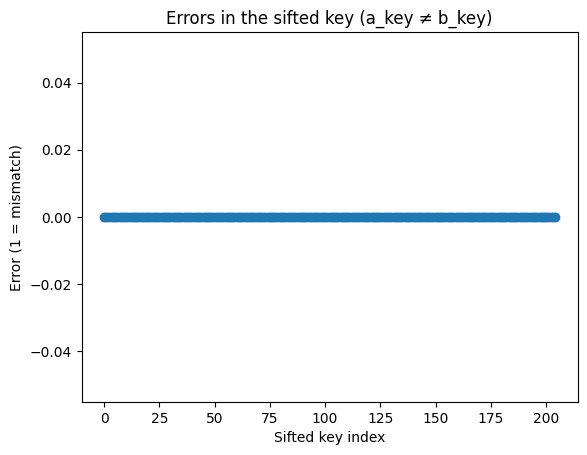

In [18]:
# Error mask in the sifted key
error_mask = (a_key != b_key)

plt.figure()
plt.plot(error_mask.astype(int), linestyle="none", marker="o")
plt.title("Errors in the sifted key (a_key ≠ b_key)")
plt.xlabel("Sifted key index")
plt.ylabel("Error (1 = mismatch)")
plt.show()


### 2.3 **Trial**

Now that we have the secret key between Alice and Bob, we can encrypt a message so that Bob is the only one that can decrypt the message

In [19]:
def text_to_bits(text):
    """
    Convert a text string into its binary representation.
    Each character is encoded using 8-bit ASCII.
    """
    return ''.join(format(ord(c), '08b') for c in text)

# Message to be encrypted using the sifted key
message = "QUANTUM COMPUTING"

# Convert the message into a binary array
message_bits = np.array([int(b) for b in text_to_bits(message)])

# Display the message and its binary representation
print("Message:", message)
print("Binary:", message_bits)

# Check that the message length does not exceed the available sifted key length
# (required for one-time pad encryption)
if len(message_bits) > len(a_key):
    print("Message too long: insufficient key length for one-time pad encryption.")


Message: QUANTUM COMPUTING
Binary: [0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 0 1 0
 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1
 0 0 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1]


In [20]:
# Truncate the sifted raw keys to match the message length
# This ensures that the key length equals the message length,
a_key = a_key[:len(message_bits)]
b_key = b_key[:len(message_bits)]


In [21]:
# Encrypt the message using a one-time pad (XOR with Alice's sifted key)
cipher_bits = message_bits ^ a_key

# Decrypt the ciphertext using Bob's sifted key
# In the ideal (no Eve, no noise) case, b_key = a_key, so decryption is exact
decrypted_bits = cipher_bits ^ b_key

# Display the ciphertext and the decrypted message bits
print("Cipher bits:", cipher_bits)
print("Decrypted bits:", decrypted_bits)


Cipher bits: [0 0 0 1 1 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 1 0 0 1 1 0 0 0 1 0 1 0
 1 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0
 0 1 1 1 1 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 1 1]
Decrypted bits: [0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 0 1 0
 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1
 0 0 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1]


In [22]:
def bits_to_text(bits):
    """
    Convert a binary array back into a text string.
    The bit sequence is grouped into 8-bit chunks and
    decoded using standard ASCII encoding.
    """
    chars = []
    for i in range(0, len(bits), 8):
        byte = bits[i:i+8]
        chars.append(chr(int(''.join(map(str, byte)), 2)))
    return ''.join(chars)

# Decode the decrypted bit string back into readable text
decoded_message = bits_to_text(decrypted_bits)

# Display the recovered plaintext message
print("Decoded message:", decoded_message)


Decoded message: QUANTUM COMPUTING


## 3. **BB84 Simulation Without Eve**

### 3.1 **Simulation**

In [6]:
for i in range(N):

    # -------------------------
    # 1) Alice -> Eve
    # -------------------------
    qc_eve = QuantumCircuit(1, 1)

    # Alice prepares state according to (a_bits[i], a_basis[i])
    if a_basis[i] == 'Z':
        if a_bits[i] == 1:
            qc_eve.x(0)
    else:
        qc_eve.h(0)
        if a_bits[i] == 1:
            qc_eve.z(0)

    # Eve measures in basis E_i
    if e_basis[i] == 'X':
        qc_eve.h(0)
    qc_eve.measure(0, 0)

    res_eve = backend.run(transpile(qc_eve, backend), shots=1).result()
    e_bits[i] = int(next(iter(res_eve.get_counts().keys())))

    # -------------------------
    # 2) Eve -> Bob (resend)
    # -------------------------
    qc_bob = QuantumCircuit(1, 1)

    # Eve prepares a new qubit consistent with (e_bits[i], e_basis[i])
    if e_basis[i] == 'Z':
        if e_bits[i] == 1:
            qc_bob.x(0)
    else:
        qc_bob.h(0)
        if e_bits[i] == 1:
            qc_bob.z(0)

    # Bob measures in basis B_i
    if b_basis[i] == 'X':
        qc_bob.h(0)
    qc_bob.measure(0, 0)

    res_bob = backend.run(transpile(qc_bob, backend), shots=1).result()
    b_bits[i] = int(next(iter(res_bob.get_counts().keys())))

print("Eve bits:", e_bits)
print("Bob bits:", b_bits)


Eve bits: [1 0 1 0 0 0 0 1 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 0 0 0
 0 1 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0
 0 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 1 0 1
 1 1 0 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 1 0
 0 1 1 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 1
 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 1 1 1 1 0 1 1 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0
 1 1 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0
 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 0 1 1 0 0 1
 0 0 0 0 0 1 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0]
Bob bits: [0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0 0 0 0 0 1 1 1 1 0 1 1 0 1 0 0 0 0 0 0 1 0
 0 1 1 0 0 1 0 0 1

In [7]:
# Basis reconciliation (sifting): keep only rounds where A_i = B_i
sift_mask = (a_basis == b_basis)

# Sifted raw keys (candidate key material)
a_key = a_bits[sift_mask]
b_key = b_bits[sift_mask]

# Sift rate: fraction of rounds kept after basis reconciliation
sift_rate = np.mean(sift_mask)

# QBER: fraction of mismatches in the sifted raw key
qber = np.mean(a_key != b_key) if len(a_key) > 0 else np.nan

print("SIFT RATE:", sift_rate)
print("SIFTED KEY LENGTH:", len(a_key))
print("QBER:", qber)


SIFT RATE: 0.5125
SIFTED KEY LENGTH: 205
QBER: 0.32195121951219513


### 3.2 **Results**

In [8]:
# --- Summary (with Eve case) ---
summary = pd.DataFrame({
    "N": [N],
    "sifted_len": [len(a_key)],
    "sift_rate": [sift_rate],
    "QBER": [qber]
})
display(summary)

# --- Round-by-round log (with Eve) ---
df = pd.DataFrame({
    "round": np.arange(N),
    "A_basis": a_basis,
    "a_bit": a_bits,
    "E_basis": e_basis,
    "e_bit": e_bits,
    "B_basis": b_basis,
    "b_bit": b_bits,
    "kept": sift_mask
})

# Kept rounds (A_basis == B_basis), i.e., rounds contributing to the sifted raw key
df_kept = df[df["kept"]].reset_index(drop=True)
display(df_kept.head(30))  # show first 30 kept rounds

# Indices kept after sifting
kept_idx = np.where(sift_mask)[0]

# Display truncated outputs for readability
print("Kept indices (first 30):", kept_idx[:30], "..." if len(kept_idx) > 30 else "")
print("Alice sifted key (first 50):", a_key[:50], "..." if len(a_key) > 50 else "")
print("Bob   sifted key (first 50):", b_key[:50], "..." if len(b_key) > 50 else "")


,N,sifted_len,sift_rate,QBER
0,400,205,0.5125,0.321951


,round,A_basis,a_bit,E_basis,e_bit,B_basis,b_bit,kept
0,0,Z,0,X,1,Z,0,True
1,1,Z,1,X,0,Z,0,True
2,3,X,0,X,0,X,0,True
3,6,X,0,Z,0,X,1,True
4,7,X,1,X,1,X,1,True
5,11,Z,1,X,1,Z,0,True
6,13,Z,0,Z,0,Z,0,True
7,18,Z,1,Z,1,Z,1,True
8,19,X,1,X,1,X,1,True
9,21,X,1,Z,1,X,1,True


Kept indices (first 30): [ 0  1  3  6  7 11 13 18 19 21 23 24 25 27 30 31 32 34 35 36 40 44 45 49
 50 52 53 54 55 57] ...
Alice sifted key (first 50): [0 1 0 0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 1 0 1 0 1 0 0 0 1 1 0] ...
Bob   sifted key (first 50): [0 0 0 1 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 1 0 0 0 0] ...


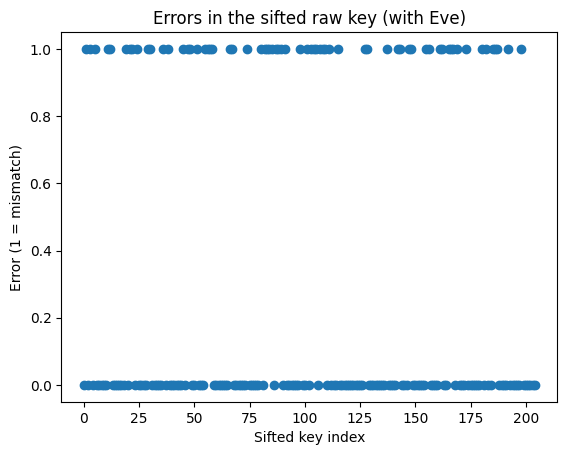

In [9]:
# Error mask in the sifted raw key (with Eve)
# error_mask[i] = 1 if Alice's and Bob's bits differ in the i-th sifted round
error_mask = (a_key != b_key)

plt.figure()
plt.plot(error_mask.astype(int), linestyle="none", marker="o")
plt.title("Errors in the sifted raw key (with Eve)")
plt.xlabel("Sifted key index")
plt.ylabel("Error (1 = mismatch)")
plt.show()


### 3.3 **Trial**

Now that we have the secret key between Alice and Bob, we can encrypt a message so that Bob is the only one that can decrypt the message

In [10]:
def text_to_bits(text):
    """
    Convert a text string into its binary representation.
    Each character is encoded using 8-bit ASCII.
    """
    return ''.join(format(ord(c), '08b') for c in text)

# Message to be encrypted using the sifted raw key
# The message length in bits must not exceed the available key length
message = "QCP"

# Convert the message to a NumPy array of bits
message_bits = np.array([int(b) for b in text_to_bits(message)])

# Display the message and its binary encoding
print("Message:", message)
print("Binary:", message_bits)

# Check key-length requirement for one-time pad encryption
if len(message_bits) > len(a_key):
    print("Message too long: insufficient key length for one-time pad encryption.")


Message: QCP
Binary: [0 1 0 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0]


In [11]:
# Truncate the sifted raw keys to match the message length
# This is required for one-time pad encryption, which needs
# the key and the message to have the same length
a_key = a_key[:len(message_bits)]
b_key = b_key[:len(message_bits)]


In [12]:
# Encrypt the message using a one-time pad (XOR with Alice's sifted raw key)
cipher_bits = message_bits ^ a_key

# Decrypt the ciphertext using Bob's sifted raw key
# In the presence of Eve, errors in the key (QBER > 0)
# may cause incorrect decryption
decrypted_bits = cipher_bits ^ b_key

# Display the ciphertext and the decrypted bit sequence
print("Cipher bits:", cipher_bits)
print("Decrypted bits:", decrypted_bits)


Cipher bits: [0 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 1 0 1]
Decrypted bits: [0 0 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 1 0 0 0 1 1 0]


In [13]:
def bits_to_text(bits):
    """
    Convert a binary array back into a text string.
    The bit sequence is grouped into 8-bit chunks and
    decoded using standard ASCII encoding.
    """
    chars = []
    for i in range(0, len(bits), 8):
        byte = bits[i:i+8]
        chars.append(chr(int(''.join(map(str, byte)), 2)))
    return ''.join(chars)

# Decode the decrypted bit string back into text
# In the presence of Eve, decoding may produce corrupted characters
decoded_message = bits_to_text(decrypted_bits)

# Display the decoded message
print("Decoded message:", decoded_message)



Decoded message: [F


## 4. **Conclusions**


In this notebook, we have implemented and analyzed the BB84 quantum key distribution protocol through numerical simulation, considering both an ideal quantum channel and the presence of an eavesdropper performing an intercept–resend attack. In the absence of Eve, the protocol behaves as expected: approximately half of the transmitted rounds survive the basis reconciliation step, the sifted raw keys of Alice and Bob coincide, and the resulting quantum bit error rate (QBER) is effectively zero. This confirms the correct functioning of BB84 in ideal conditions and validates the one-time pad encryption based on the shared sifted key.

When an eavesdropper is introduced, the simulation clearly reveals the fundamental security mechanism of BB84. Although Eve can extract partial information by measuring and resending quantum states, her intervention inevitably disturbs the quantum channel. This disturbance manifests as a significant increase in the QBER, which converges to approximately 25% in agreement with theoretical predictions for the intercept–resend attack. As a consequence, the sifted keys of Alice and Bob differ, and the one-time pad encryption fails to reliably recover the original message, illustrating why the generated key must be discarded.

Overall, the results demonstrate how quantum mechanics enforces a trade-off between information gain and disturbance, enabling the detection of eavesdropping without relying on computational assumptions. The simulations presented here provide an intuitive and quantitative illustration of the core principles underlying quantum key distribution and highlight the fundamental advantage of BB84 over classical key exchange protocols.


# **Appendix**

### A. **Circuit-level implementation of the BB84 protocol without eavesdropping**

In [7]:
# Circuit N qubits, N classical bits
qc = QuantumCircuit(N, N)

#Alice
for i in range(N):
    if a_basis[i] == 'Z':
        # bit 1 -> |1> apply X
        if a_bits[i] == 1:
            qc.x(i)
    else:
        # basis X: bit 0 -> |+> = H|0>
        #        bit 1 -> |-> = ZH|0>
        qc.h(i)
        if a_bits[i] == 1:
            qc.z(i)

#Measuring for Bob
for i in range(N):
    if b_basis[i] == 'X':
        # measure in X = apply H and measure in Z
        qc.h(i)
    qc.measure(i, i)

qc.draw(output="mpl")

### B. **Circuit-level implementation of the BB84 protocol with eavesdropping**

In [14]:
qc = QuantumCircuit(N, 2*N)

for i in range(N):
    # --- Alice prepares ---
    if a_basis[i] == 'Z':
        if a_bits[i] == 1:
            qc.x(i)
    else:
        qc.h(i)
        if a_bits[i] == 1:
            qc.z(i)

    # --- Eve measures ---
    if e_basis[i] == 'X':
        qc.h(i)
    qc.measure(i, i)

    # --- Eve resends (symbolic) ---
    qc.reset(i)
    if e_basis[i] == 'Z':
        qc.x(i)      # placeholder resend
    else:
        qc.h(i)

    # --- Bob measures ---
    if b_basis[i] == 'X':
        qc.h(i)
    qc.measure(i, N + i)

qc.draw(output="mpl")


KeyboardInterrupt: 